<a href="https://colab.research.google.com/github/aashrithresearch/endometrial-adenocarcinoma/blob/main/models/densenet169.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from fastai.vision.all import *
from fastai.callback.fp16 import *
import torch
import os
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
path = '/content/drive/MyDrive/histopathological image dataset for ET'

In [3]:
print(os.listdir(path))

['EA', 'Non EA', 'feature_dict.p', 'lsh.p']


In [4]:
dblock = DataBlock(blocks = (ImageBlock, CategoryBlock),
                   get_items = get_image_files,
                   get_y = parent_label,
                   splitter = RandomSplitter(seed=42, valid_pct=0.2),
                   item_tfms = Resize(224),
                   batch_tfms = aug_transforms(mult=2))
dls = dblock.dataloaders(path, bs=32)

In [5]:
train_ds = dls.train_ds
dls = dblock.dataloaders(path)
from collections import Counter
class_counts = Counter([train_ds.items[i].parent.name for i in range(len(train_ds))])

print("Number of samples per class in the training set:")
for cls, count in class_counts.items():
    print(f"{cls}: {count}")

Number of samples per class in the training set:
Non EA: 2233
EA: 411


In [6]:
valid_ds = dls.valid_ds
valid_class_counts = Counter([valid_ds.items[i].parent.name for i in range(len(valid_ds))])

print("\nNumber of samples per class in the validation set:")
for cls, count in valid_class_counts.items():
    print(f"{cls}: {count}")


Number of samples per class in the validation set:
Non EA: 536
EA: 124


In [7]:
from math import ceil
batch = dls.one_batch()
batch_size = batch[0].shape[0]
ncols = 10
nrows = ceil(batch_size / ncols)

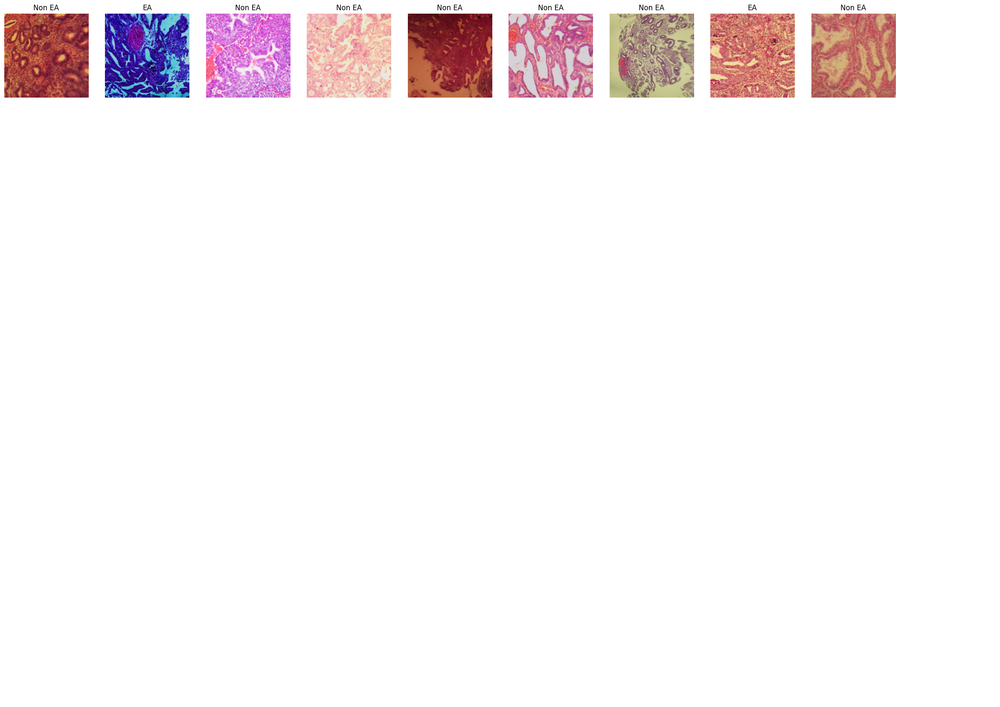

In [8]:
dls.show_batch(nrows=nrows, ncols=10)

In [9]:
metrics = [
    accuracy,
    Precision(average='macro'),
    Recall(average='macro'),
    F1Score(average='macro'),
]

In [10]:
learn169 = vision_learner(dls, densenet169, metrics=metrics, cbs=[GradientAccumulation(n_acc=16)], loss_func=FocalLoss(), opt_func=Adam).to_fp16()

Downloading: "https://download.pytorch.org/models/densenet169-b2777c0a.pth" to /root/.cache/torch/hub/checkpoints/densenet169-b2777c0a.pth
100%|██████████| 54.7M/54.7M [00:00<00:00, 121MB/s]


SuggestedLRs(valley=0.0012022644514217973)

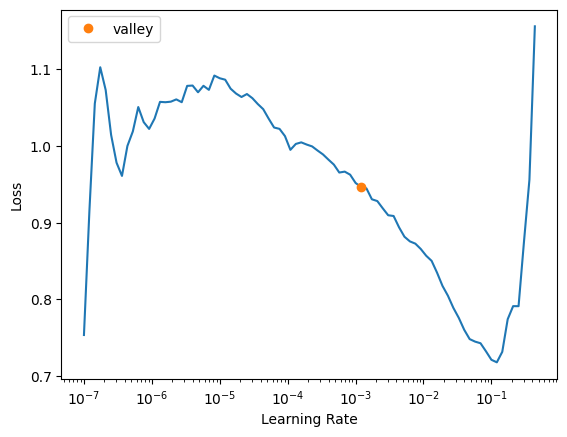

In [11]:
learn169.lr_find()

In [12]:
learn169.fit_one_cycle(15, 1e-3, cbs=[SaveModelCallback(fname='densenet169')])

epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,0.781539,0.208652,0.750000,0.681657,0.777895,0.689672,01:26
1,0.621756,0.123083,0.868182,0.783349,0.853755,0.809179,00:38
2,0.468934,0.179014,0.825758,0.743210,0.843133,0.768144,00:36
3,0.315060,0.068673,0.943939,0.897287,0.928292,0.911649,00:36
4,0.215128,0.079238,0.928788,0.900973,0.856975,0.876689,00:38
5,0.150790,0.061635,0.943939,0.909138,0.906596,0.907860,00:35
6,0.105293,0.045827,0.950000,0.915063,0.922725,0.918828,00:35
7,0.079019,0.042870,0.965151,0.964410,0.919656,0.940064,00:37
8,0.067290,0.049559,0.951515,0.955000,0.883365,0.913973,00:36
9,0.059608,0.042496,0.948485,0.945499,0.881500,0.909239,00:36


Better model found at epoch 0 with valid_loss value: 0.20865242183208466.
Better model found at epoch 1 with valid_loss value: 0.12308334559202194.
Better model found at epoch 3 with valid_loss value: 0.06867291778326035.
Better model found at epoch 5 with valid_loss value: 0.06163472309708595.
Better model found at epoch 6 with valid_loss value: 0.045827243477106094.
Better model found at epoch 7 with valid_loss value: 0.04286967217922211.
Better model found at epoch 9 with valid_loss value: 0.04249565303325653.
Better model found at epoch 11 with valid_loss value: 0.04118772968649864.
Better model found at epoch 12 with valid_loss value: 0.037483349442481995.
Better model found at epoch 14 with valid_loss value: 0.037171147763729095.


In [15]:
learn169.unfreeze()

SuggestedLRs(valley=2.0892961401841603e-05)

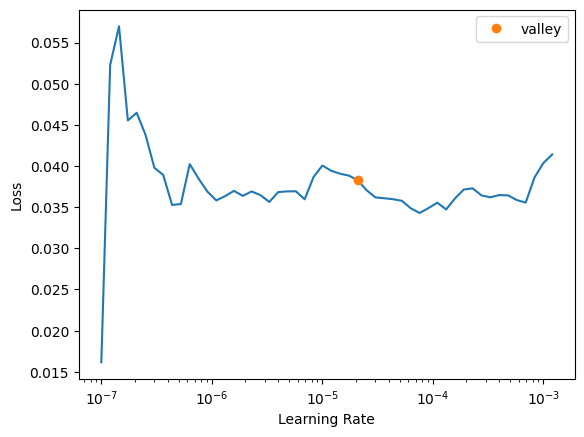

In [16]:
learn169.lr_find()

In [17]:
learn169.fit_one_cycle(15, 1e-5, cbs=[SaveModelCallback(fname='densenet169_stage2')])

epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,0.030260,0.036767,0.956061,0.939091,0.914059,0.925917,00:42
1,0.034953,0.038259,0.953030,0.939423,0.902895,0.919757,00:38
2,0.037422,0.038255,0.959091,0.950254,0.912825,0.930111,00:39
3,0.034806,0.038105,0.956061,0.951167,0.901661,0.923914,00:38
4,0.041432,0.039209,0.953030,0.939423,0.902895,0.919757,00:39
5,0.037251,0.035680,0.954545,0.937825,0.910026,0.923112,00:38
6,0.035232,0.036708,0.951515,0.938182,0.898863,0.916891,00:39
7,0.031893,0.036728,0.953030,0.939423,0.902895,0.919757,00:36
8,0.030069,0.034792,0.953030,0.933825,0.909094,0.920808,00:38
9,0.030809,0.036258,0.953030,0.942432,0.899795,0.919217,00:38


Better model found at epoch 0 with valid_loss value: 0.03676684573292732.
Better model found at epoch 5 with valid_loss value: 0.035679858177900314.
Better model found at epoch 8 with valid_loss value: 0.03479224815964699.


In [18]:
class SaveFeatures():
    features=None
    def __init__(self, m):
        self.hook = m.register_forward_hook(self.hook_fn)
        self.features = None
    def hook_fn(self, module, input, output):
        out = output.detach().cpu().numpy()
        if isinstance(self.features, type(None)):
            self.features = out
        else:
            self.features = np.row_stack((self.features, out))
    def remove(self):
        self.hook.remove()

sf = SaveFeatures(learn169.model[1][5])

In [19]:
! pip install lshashpy3 -q

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 288.3/288.3 kB 16.7 MB/s eta 0:00:00


In [20]:
import matplotlib.pyplot as plt
from lshashpy3 import LSHash
from PIL import Image
from tqdm import tqdm_notebook
import pandas as pd
import pickle
import numpy as np

In [21]:
preds, targs = learn169.get_preds(dl=dls.train)

preds, targs = learn169.get_preds(dl=dls.valid)

In [22]:
img_path = [str(x) for x in (list(dls.train_ds.items)+list(dls.valid_ds.items))]
feature_dict = dict(zip(img_path,sf.features))

In [23]:
feature_dict

{'/content/drive/MyDrive/histopathological image dataset for ET/Non EA/1812956-4.JPG': array([0.     , 0.     , 0.     , 0.     , 0.6587 , 0.     , 2.041  ,
        0.     , 2.557  , 0.     , 0.     , 2.21   , 0.     , 0.     ,
        0.     , 0.     , 2.48   , 0.055  , 0.     , 0.     , 0.     ,
        0.     , 0.     , 0.     , 0.06415, 1.554  , 0.     , 0.     ,
        0.     , 0.1758 , 0.     , 0.     , 0.     , 0.     , 0.     ,
        0.     , 0.     , 1.107  , 2.023  , 0.     , 2.846  , 0.     ,
        0.     , 0.     , 0.7993 , 0.     , 0.     , 0.     , 0.     ,
        0.     , 0.     , 0.     , 0.63   , 0.     , 0.464  , 0.     ,
        0.     , 0.1494 , 0.0995 , 0.     , 0.5117 , 0.     , 0.5015 ,
        0.     , 0.     , 0.4587 , 0.     , 0.827  , 0.     , 0.     ,
        0.     , 0.     , 1.8545 , 2.715  , 0.0977 , 0.     , 0.     ,
        0.     , 0.     , 0.338  , 0.2091 , 0.     , 0.0789 , 0.     ,
        0.     , 2.502  , 0.     , 0.     , 0.     , 0.     , 

In [24]:
import pickle
import os

pickle.dump(feature_dict, open(os.path.join(path, "feature_dict.p"), "wb"))

In [25]:
feature_dict = pickle.load(open(os.path.join(path, 'feature_dict.p'),'rb'))

In [26]:
k = 10
L = 5
d = 512
lsh = LSHash(hash_size=k, input_dim=d, num_hashtables=L)

for img_path, vec in tqdm_notebook(feature_dict.items()):
    lsh.index(vec.flatten(), extra_data=img_path)

<ipython-input-26-8200aacc7847>:6: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for img_path, vec in tqdm_notebook(feature_dict.items()):


  0%|          | 0/3304 [00:00<?, ?it/s]

In [27]:
pickle.dump(lsh, open(os.path.join(path, 'lsh.p'), "wb"))

In [28]:
feature_dict = pickle.load(open(os.path.join(path, 'feature_dict.p'),'rb'))
lsh = pickle.load(open(os.path.join(path, 'lsh.p'),'rb'))

In [29]:
def get_similar_item(idx, feature_dict, lsh_variable,output_name, n_items=5):
    response = lsh_variable.query(feature_dict[list(feature_dict.keys())[idx]].flatten(),
                     num_results=n_items+1, distance_func='hamming')

    columns = 3
    rows = int(np.ceil(n_items+1/columns))
    fig=plt.figure(figsize=(2*rows, 3*rows))
    for i in range(1, columns*rows +1):
        if i<n_items+2:
            img = Image.open(response[i-1][0][1])
            fig.add_subplot(rows, columns, i)
            plt.imshow(img)
    plt.savefig('output/'+ output_name + '.jpg', bbox_inches="tight", pad_inches=0)
    return plt.show()

In [30]:
def get_similar_item_vect(vect, feature_dict, lsh_variable, output_name, n_items=5):
    response = lsh_variable.query(vect,
                     num_results=n_items+1, distance_func='hamming')

    columns = 8
    rows = int(np.ceil(n_items+1/columns))
    fig=plt.figure(figsize=(4*rows, 6*rows))
    for i in range(1, columns*rows +1):
        if i<n_items+2:
            img = Image.open(response[i-1][0][1])
            fig.add_subplot(rows, columns, i)
            plt.imshow(img)
    plt.savefig('output/' + output_name + '.jpg', bbox_inches="tight", pad_inches=0)
    return plt.show()


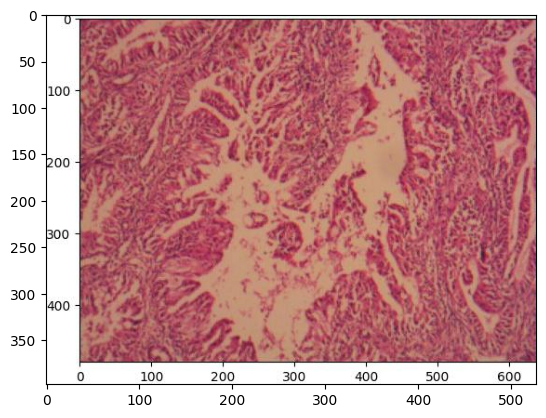

In [31]:
image_pth = '/content/drive/MyDrive/histopathological image dataset for ET/EA/1608968.JPG'

imagenumber = list(feature_dict.keys()).index(image_pth)
img = Image.open(list(feature_dict.keys())[imagenumber])
plt.imshow(img)
plt.savefig(image_pth, bbox_inches="tight", pad_inches=0)

In [32]:
def get_similar_item(idx, feature_dict, lsh_variable,output_name, n_items=5):
    response = lsh_variable.query(feature_dict[list(feature_dict.keys())[idx]].flatten(),
                     num_results=n_items+1, distance_func='hamming')

    columns = 3
    rows = int(np.ceil(n_items+1/columns))
    fig=plt.figure(figsize=(2*rows, 3*rows))
    for i in range(1, columns*rows +1):
        if i<n_items+2:
            img = Image.open(response[i-1][0][1])
            fig.add_subplot(rows, columns, i)
            plt.imshow(img)

    !mkdir -p output
    plt.savefig(os.path.join('output', output_name + '.jpg'), bbox_inches="tight", pad_inches=0)
    return plt.show()

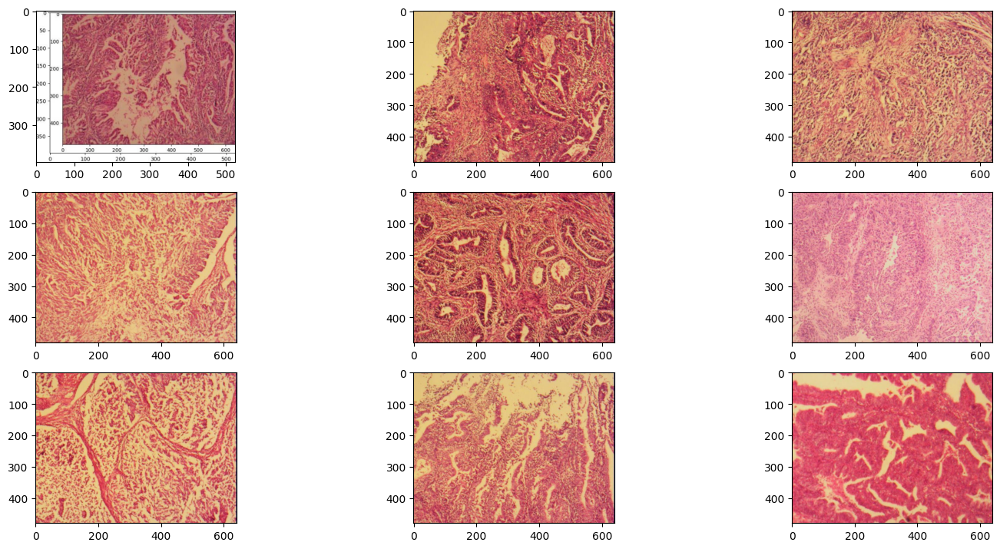

In [33]:
get_similar_item(imagenumber, feature_dict, lsh, img_path + 'similar', 8 )

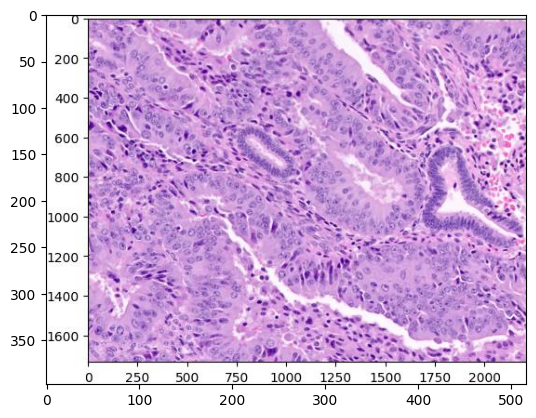

In [34]:
test_path = '/content/drive/MyDrive/test non ea/test-nonEA.jpg'
img = Image.open(test_path)
plt.imshow(img)
plt.savefig(test_path, bbox_inches="tight", pad_inches=0)

In [35]:
preds = learn169.predict(test_path)

In [36]:
preds

("['EA', 'EA']", tensor([ 0.6768, -0.3203]), tensor([ 0.6768, -0.3203]))

In [37]:
learn169.export('densenet169.pkl')

In [38]:
learn169 = load_learner('densenet169.pkl')